# Vertebal Classification

A vertebra (plural: vertebrae) is one of the series of small bones that form the vertebral column, also known as the spine or backbone.

Each vertebra is a bony unit that:

- Protects the spinal cord

- Supports the body’s weight

- Allows movement, bending, and rotation

The lumbar region refers to one of the lower parts of the spine and the lower back area of the body. As shown in the figure below, the lumbar region comprises five regions named L1, L2, L3, L4, and L5.

<div style="text-align: center;">
  <img src="lumbar-spine.png" alt="description">
</div>

In this task, we aim to develop a classification framework that categorises the 3D meshes of L1, L3, and L5 regions into their corresponding anatomical classes. To do this, we need to implement the following sections: 
1. Importing the Required Packages
2. Loading Dataset
3. Normalising 3D shapes
4. Storing Points and Labels Into Arrays
5. Normalising 3D shapes
6. Loading Vector Extraction Using PCA
7. Developing the Classification Framework
8. Training and Testing the Classification Framework Using the Best Classifier and Number of Features

The dataset is saved in the data folder. All the meshes are saved in the VTK file. If you want to open these files, you can download and install paraview software from the link below: 

https://www.paraview.org/download/


## Installing Packages

Please run the below cell to install the required packages for this task. Once you run the cell, please restart the kernel and run the next cells.

In [1]:
!pip install -r requirements.txt

## Importing the Required Packages 

In [2]:
import os 
import pyvista as pv
import random
import numpy as np 
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from IPython.display import Image, display

import pyvista as pv
pv.set_jupyter_backend("static")

## Declaring the Dataset-related Varibales

In this section, we declare some dataset-related variables such as the direction of the dataset, the number of subjects, and the classes' names. 

In [3]:
data_dir = "data" 
n_subjects = 30 
vertebrae_classes = ["L1", "L3", "L5"] 

## Random Data Visualization

By running this cell, you can vislulise some of the mesh data using pyvista package

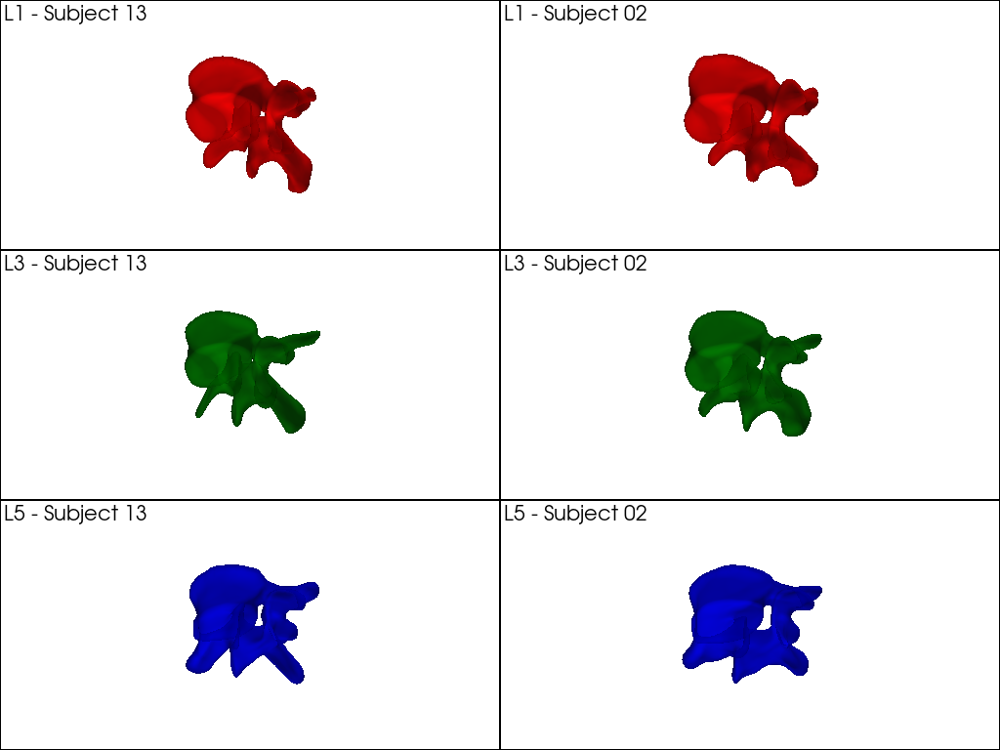

In [4]:
random_subjects = random.sample(range(1, n_subjects+1), 2)
random_subject_ids = [f"{x:02d}" for x in random_subjects]
random_subject_ids



colors = {
    "L1": "red",
    "L3": "green",
    "L5": "blue"
}


plotter = pv.Plotter(shape=(3, 2), border=True)


for row, vertebra in enumerate(vertebrae_classes):

  
    for col, sid in enumerate(random_subject_ids):
        
       
        plotter.subplot(row, col)

       
        filename = f"{vertebra}_{sid}.vtk"
        file_path = os.path.join(data_dir, vertebra, filename)
        
       
        mesh = pv.read(file_path)

        
        plotter.add_mesh(mesh,
                         color=colors[vertebra],
                         opacity=0.9,
                         smooth_shading=True)

  
        plotter.add_text(f"{vertebra} - Subject {sid}", font_size=10)

     
        plotter.camera_position = "iso"

plotter.show()


## Loading Dataset

This section contains a function named load_mesh_points_faces that reads a 3D mesh file with PyVista and outputs the points and the faces in the form of Numpy arrays. After defining this funtion, there is a loop that iterates over all subjects and all vertebra types to load their corresponding points and faces. This loop stores the data in a nested dictionary that its keys represent the subject IDS and their corresponding values contain the points and faces of L1, L3, and L5 shapes.   

In [5]:
def load_mesh_points_faces(filename):
    """
    Load a mesh using PyVista and return its vertices and triangular faces
    as NumPy arrays.

    Returns:
        points (np.ndarray): shape (N, 3)
        faces (np.ndarray): shape (M, 3)
    """
    
   
    mesh = pv.read(filename)
    
    
    points = mesh.points.copy()  

    
    raw_faces = mesh.faces.reshape(-1, 4)   
    faces = raw_faces[:, 1:]                
    
    return points, faces

In [6]:
all_data = dict() 


for sub_id in range(1, n_subjects+1):
    sub_dict = dict()
    for row, vertebra in enumerate(vertebrae_classes):
        file_path = os.path.join(data_dir, vertebra, f"{vertebra}_{sub_id:02d}.vtk")
        points_arr, face_arr = load_mesh_points_faces(file_path)
        dict_data = {vertebra: {'points': points_arr, 'face': face_arr}}
        sub_dict.update(dict_data)
    all_data[sub_id] = sub_dict

In [7]:
print("Subject IDs stored in all_data:", all_data.keys())
random_sub_id = random.choice(list(all_data.keys()))
print(f"Vertebrae available for subject {random_sub_id}:", all_data[random_sub_id].keys())
print(f"Data fields stored for subject {random_sub_id}, vertebra L1:", all_data[random_sub_id]['L1'].keys())

Subject IDs stored in all_data: dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30])
Vertebrae available for subject 1: dict_keys(['L1', 'L3', 'L5'])
Data fields stored for subject 1, vertebra L1: dict_keys(['points', 'face'])


## Normalising 3D shapes

In this section, there is a function named center_and_l2_normalize that that normalises each 3D shape.

Suppose $\mathbf{X} \in \mathbb{R}^{N \times 3}$ is a 3D point cloud where $N$ denotes the number of points. Given $\mathbf{X}$, the function should perform the following procedure.  

1. Compute the mean point of the 3D point cloud ($\mathbf{\tilde{X}}$)
2. Translate the 3D point cloud to the origin by $\mathbf{X} - \mathbf{\tilde{X}}$
3. Find the maximum L2 norm of the points of the translated 3D shape.
4. Divide the points of the translated point cloud by the maximum L2 norm. 

This function translates the 3D point cloud to the origin and normalises the shape to a cube of size 1.

After declaring the function, all the points of the dataset will be normalised through this function
In the next step, normalise all the points of the dataset using this function.


In [8]:
## Normalising Function

def center_and_l2_normalize(points):
    """
    Translate point cloud centroid to (0,0,0)
    and normalize each vertex by its Euclidean norm.
    
    Args:
        points (numpy.ndarray): shape (N, 3) point cloud
    
    Returns:
        numpy.ndarray: transformed point cloud
    """
    
    centroid = np.mean(points, axis=0)
    centered = points - centroid

   
    distances = np.linalg.norm(centered, axis=1)
    max_dist = np.max(distances)

   
    normalized = centered / (max_dist + 1e-8)  
    
    return normalized

In [9]:
all_data_norm = all_data.copy()

for sub_id in all_data_norm.keys():
    sub_L1_points = all_data_norm[sub_id]['L1']['points']  
    sub_L3_points = all_data_norm[sub_id]['L3']['points']  
    sub_L5_points = all_data_norm[sub_id]['L5']['points']  

    sub_L1_points_norm = center_and_l2_normalize(sub_L1_points)
    sub_L3_points_norm = center_and_l2_normalize(sub_L3_points)
    sub_L5_points_norm = center_and_l2_normalize(sub_L5_points)

    all_data_norm[sub_id]['L1']['points'] = sub_L1_points_norm
    all_data_norm[sub_id]['L3']['points'] = sub_L3_points_norm
    all_data_norm[sub_id]['L5']['points'] = sub_L5_points_norm

## Storing Points and Labels Into Arrays

In this section, you will store the points and the labels of the dataset into $\mathbf{X_{array}} \in \mathbb{R}^{90 \times 12000}$ and $\mathbf{Y_{array}} \in \mathbb{R}^{90}$, respectively.

To do this, you have the initial lists for X and Y, and you flatten the point arrays. Then, you append the flattened point arrays to X. 

You will also apply the vertebra class names to the mapping_vert_classes function to get the coded labels for each data point. According to this function, the cases in the L1, L3, and L5 classes have labels 0, 1, and 2, respectively. 

After looping through and gathering the points and labels into X and Y, these two lists are transformed into NumPy arrays using the np.asarray() function to get  $\mathbf{X_{array}}$ and $\mathbf{Y_{array}}$. 


In [10]:
X = [] 
Y = [] 

def mapping_vert_classes(vert_class): 
    
    if vert_class == 'L1':
        num_class = 0 
    elif vert_class == 'L3': 
        num_class = 1
    elif vert_class == 'L5':
        num_class = 2 
        
    return num_class 

for sub_id in all_data_norm.keys():
    for vert_class in vertebrae_classes: 
        mesh_points = all_data_norm[sub_id][vert_class]['points']
        mesh_faces = all_data_norm[sub_id][vert_class]['face']

        X.append(mesh_points.flatten())
        Y.append(mapping_vert_classes(vert_class))

X_array = np.asarray(X)
Y_array = np.asarray(Y)

In [11]:
print("Shape of X_array (number of samples × flattened vertex coordinates):", X_array.shape)
print("Shape of Y_array (number of labels):", Y_array.shape)

Shape of X_array (number of samples × flattened vertex coordinates): (90, 12000)
Shape of Y_array (number of labels): (90,)


## Loading Vector Extraction Using PCA

**Now you need to write a function named loading_vector_extarction that performs PCA transformation on the feature matrix, $\mathbf{X} \in \mathbb{R}^{N \times M}$, where $N$ is the number of data and $M$ is the number of features. For our case, $N=90$ and $M=12000$, and returns the principal components of the dataset.** 

The principal components, also called loading vectors, indicate the directions of maximum variance in a dataset, ordered from highest to lowest. 

To write the function, please conduct the following steps. 
1. Compute the mean of the $\mathbf{X}$ regarding the number of data.
2. Subtract the $\mathbf{X}$ from the obtained mean.
3. Fit PCA on the subtracted data given the number of components.
4. Return the PCA components, mean vector, and singular values, respectively.

To define this function, you use the PCA function from the scikit-learn package, which is explained in: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

After defining this function, run it on X_array with n_components=90 using the two next cells. 

In [12]:
def loading_vector_extarction(X_array, n_components):
    """
    Perform PCA on the input matrix and extract loading vectors,
    the global mean shape, and singular values.
    
    Inputs:
        X_array (np.ndarray):
            A data matrix of shape (N, M), where N is the number of samples
            and M is the number of features (e.g., flattened mesh points).
        
        n_components (int):
            The number of principal components (loading vectors) to compute.
    
    Outputs:
        Vt (np.ndarray):
            The PCA loading vectors (principal component directions),
            with shape (n_components, M).
        
        X_mean (np.ndarray):
            The mean vector of the dataset, shape (M,). This is subtracted
            from the data before PCA.
        
        S (np.ndarray):
            The singular values of the PCA decomposition, one per component.
    """
    
    
    X_mean = np.mean(X_array, axis=0)
    
    
    X_centered = X_array - X_mean
        
    
    X_centered = np.nan_to_num(X_centered, nan=0.0, posinf=0.0, neginf=0.0)
    
    
    from sklearn.decomposition import PCA
    pca = PCA(n_components=n_components)
    pca.fit(X_centered)
    
    
    Vt = pca.components_ 
    S = pca.singular_values_  
    
    return Vt, X_mean, S

In [13]:
Vt, X_mean, S = loading_vector_extarction(X_array, n_components=90)

In [14]:
print("Shape of Vt (loading vectors = number of components × number of features):", Vt.shape)
print("Shape of X_mean (mean vector = one value per feature):", X_mean.shape)
print("Shape of X_array (original data = number of samples × number of features):", X_array.shape)
print("Shape of (X_array - X_mean) (mean-centered data):", (X_array - X_mean).shape)

Shape of Vt (loading vectors = number of components × number of features): (90, 12000)
Shape of X_mean (mean vector = one value per feature): (12000,)
Shape of X_array (original data = number of samples × number of features): (90, 12000)
Shape of (X_array - X_mean) (mean-centered data): (90, 12000)


## Shape Generation Using the First and Second Loading Vectors (Principal Components)

This section aims to visulise the geenrated shapes using the first and second Loading Vectors (Principal Components). The directions of changes that the generated shapes show are the same as the first and second Loading Vectors (Principal Components). 

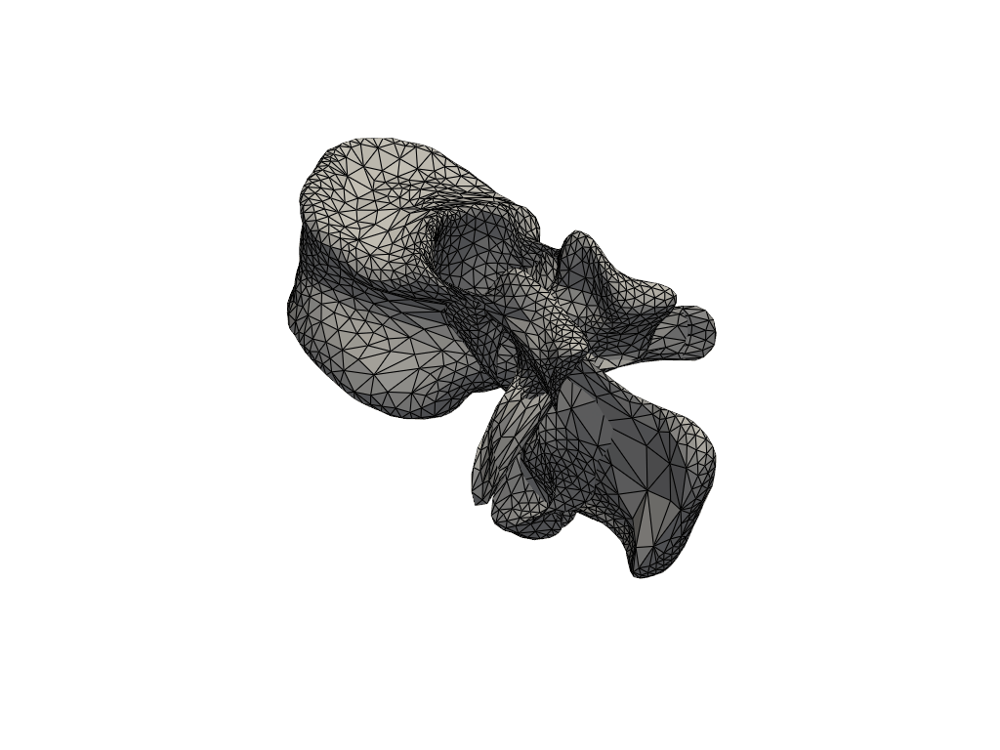

In [15]:

largest_eigen_value = S[0]
r_range = np.arange(-3 * np.sqrt(largest_eigen_value),
                    3 * np.sqrt(largest_eigen_value),
                    np.sqrt(largest_eigen_value) / 10)

gen_shapes = [] 
for r in r_range: 
    gen_shape = X_mean + (r * Vt[0, :])
    gen_shapes.append(gen_shape.reshape(4000, 3))

faces = all_data_norm[1]['L1']['face']
n_faces = faces.shape[0]
faces_pv = np.hstack(
    [np.full((n_faces, 1), 3, dtype=np.int64), faces.astype(np.int64)]
).ravel()


mesh = pv.PolyData(gen_shapes[0], faces_pv)


plotter = pv.Plotter(off_screen=True)
plotter.add_mesh(mesh, color="lightgray", show_edges=True)

gif_name = "mesh_sequence_PC1.gif"
plotter.open_gif(gif_name)

for pts in gen_shapes:
    mesh.points = pts
    plotter.render()
    plotter.write_frame()

plotter.close()


display(Image(filename=gif_name))

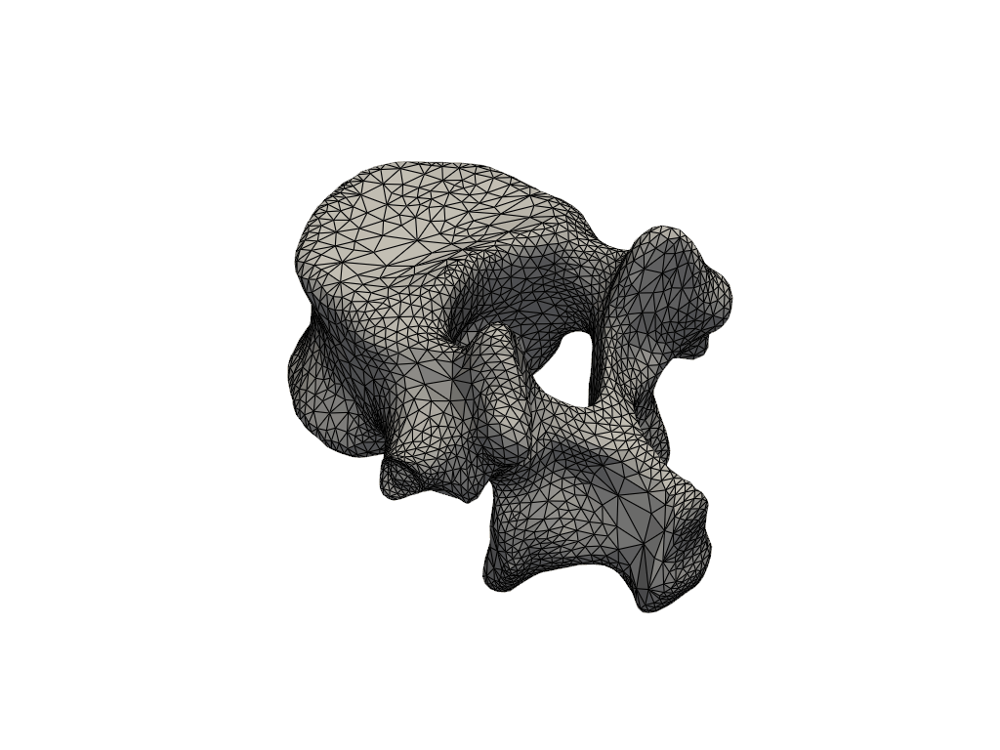

In [16]:
second_largest_eigen_value = S[1]
r_range_PC2 = np.arange(-3*np.sqrt(second_largest_eigen_value), 3*np.sqrt(second_largest_eigen_value))
gen_shapes = [] 
for r in r_range_PC2: 
    gen_shape = X_mean + (r * Vt[1,:])
    gen_shapes.append(gen_shape.reshape(4000,3))

faces = all_data_norm[1]['L1']['face']
n_faces = faces.shape[0]
faces_pv = np.hstack(
    [np.full((n_faces, 1), 3, dtype=np.int64), faces.astype(np.int64)]
).ravel()

mesh = pv.PolyData(gen_shapes[0], faces_pv)

plotter = pv.Plotter()
plotter.add_mesh(mesh, color="lightgray", show_edges=True)

gif_name = "mesh_sequence_PC2.gif"
plotter.open_gif(gif_name)

for pts in gen_shapes:
    mesh.points = pts
    plotter.render()
    plotter.write_frame()

plotter.close()

display(Image(filename=gif_name))

## Developing the Classification Framework

In this section, we aim to develop a classification framework that assigns each case in our dataset to L1, L2, or L3 classes. Suppose we split the data set (X_array, Y_array) into training and test subsets, with 80% of the data going to the training subset and the remaining 20% to the test subset. Since the number of features of our dataset is very large (12000), we intend to use the loading_vector_extraction function to reduce the feature space dimension to the most informative features. 

We assumed a range of 10 to 75 components for our PCA feature reduction function (loading_vector_extraction), and three classifiers, SVM, KNN, and logistic regression (LR), for the classification model. The feature_matrix_cal function projects the data onto the obtained principal components in the next two cells. 

**Your main objective is to find the optimal and worst number of components and the classifier for the classification framework that leads to the best and worst classification accuracy.**

**To achieve this objective, you need to complete the loop of the third cell. In this cell, there is a loop that iterates over the range of components. In this loop, you need to apply our PCA feature reduction function (feature_matrix_cal) to the training set to obtain the principal components. Then, you should project the testing dataset to the obtained principal components with the aid of feature_matrix_cal function. After you do this, another loop iterates over the classifiers to train and test them using our dataset with a new feature representation.** 



In [17]:
# -------------------------------------------------------
# Train-test split
# -------------------------------------------------------

X_train, X_test, Y_train, Y_test = train_test_split(
    X_array, Y_array, test_size=0.3, stratify=Y_array, random_state=42
)

print("X_train shape (training samples × features):", X_train.shape)
print("X_test shape  (test samples × features):", X_test.shape)
print("Y_train shape (training labels):", Y_train.shape)
print("Y_test shape  (test labels):", Y_test.shape)

n_components = np.arange(10, 60, 5)
print("List of PCA components to evaluate:", n_components)

X_train shape (training samples × features): (63, 12000)
X_test shape  (test samples × features): (27, 12000)
Y_train shape (training labels): (63,)
Y_test shape  (test labels): (27,)
List of PCA components to evaluate: [10 15 20 25 30 35 40 45 50 55]


In [18]:
def feature_matrix_cal(X_array, Vt, X_mean):
    """
    Compute the PCA feature matrix by projecting samples onto
    the PCA loading vectors.

    Inputs:
        X_array (np.ndarray):
            The original data matrix of shape (N, M),
            where N is the number of samples and
            M is the number of features (e.g., flattened mesh coordinates).

        Vt (np.ndarray):
            The PCA loading vectors (principal components),
            with shape (K, M), where K is the number of components used.

        X_mean (np.ndarray):
            The mean vector of the training data, shape (M,).
            This is used to mean-center the samples before projection.

    Output:
        X_feature_matrix (np.ndarray):
            The PCA feature matrix of shape (N, K).
            Each row contains the K PCA coefficients (scores) for one sample.
            This represents the lower-dimensional encoding of the data.
    """

    X_feature_matrix = Vt @ (X_array - X_mean).T
    X_feature_matrix = X_feature_matrix.T
    return X_feature_matrix

**You need to complete the cell below to find the best and worst number of components. You can use the provided template to complete the cell.** 

In [19]:
results = {}

# -------------------------------------------------------
# Evaluate all numbers of components with all classifiers
# -------------------------------------------------------
for each_num_components in n_components:

    ### Write your code here 
  
    Vt, X_mean, S = loading_vector_extarction(X_train, n_components=each_num_components)
    
   
    X_train_pca = feature_matrix_cal(X_train, Vt, X_mean)
    X_test_pca = feature_matrix_cal(X_test, Vt, X_mean)

    """
    Apply PCA Feature reduction here 
    """

    ## Use standard scaling for normalisation on both training and testing sets
    scaler = StandardScaler()
    X_train_transformed = scaler.fit_transform(X_train_pca)
    X_test_transformed  = scaler.transform(X_test_pca)

    ## You can use the results variable to save the accaracies for each number of components and classifier 
    results[int(each_num_components)] = {}

    ## Declaring the classfication models 
    knn_model = KNeighborsClassifier(n_neighbors=5)
    svm_model = SVC(kernel="linear", C=1, decision_function_shape="ovr")
    lr_model  = LogisticRegression()

    """
    Train and test the classifiers 
"""
       
    knn_model.fit(X_train_transformed, Y_train)
    svm_model.fit(X_train_transformed, Y_train)
    lr_model.fit(X_train_transformed, Y_train)
    
   
    knn_acc = accuracy_score(Y_test, knn_model.predict(X_test_transformed))
    svm_acc = accuracy_score(Y_test, svm_model.predict(X_test_transformed))
    lr_acc = accuracy_score(Y_test, lr_model.predict(X_test_transformed))
    

    results[int(each_num_components)]["KNN"]       = knn_acc
    results[int(each_num_components)]["LinearSVM"] = svm_acc
    results[int(each_num_components)]["LR"]        = lr_acc

    print(f"Components={each_num_components}, Classifier = KNN,       Accuracy={knn_acc:.4f}")
    print(f"Components={each_num_components}, Classifier = LinearSVM, Accuracy={svm_acc:.4f}")
    print(f"Components={each_num_components}, Classifier = LR,        Accuracy={lr_acc:.4f}")

# -------------------------------------------------------
# Find the global best AND worst classifier and component count
# -------------------------------------------------------
best_components   = None
best_classifier   = None
best_accuracy     = -1.0

worst_components  = None
worst_classifier  = None
worst_accuracy    = 1.0  # start from 1 (max possible accuracy)

for comp, clf_dict in results.items():
    for clf_name, acc in clf_dict.items():
        # Check for best
        if acc > best_accuracy:
            best_accuracy   = acc
            best_classifier = clf_name
            best_components = comp
        # Check for worst
        if acc < worst_accuracy:
            worst_accuracy   = acc
            worst_classifier = clf_name
            worst_components = comp

print("\n========================")
print("Best configuration found")
print("========================")
print(f"Best number of components : {best_components}")
print(f"Best classifier           : {best_classifier}")
print(f"Best accuracy             : {best_accuracy:.4f}")

print("\n========================")
print("Worst configuration found")
print("========================")
print(f"Worst number of components: {worst_components}")
print(f"Worst classifier          : {worst_classifier}")
print(f"Worst accuracy            : {worst_accuracy:.4f}")


Components=10, Classifier = KNN,       Accuracy=0.8889
Components=10, Classifier = LinearSVM, Accuracy=0.9259
Components=10, Classifier = LR,        Accuracy=0.9259
Components=15, Classifier = KNN,       Accuracy=0.7407
Components=15, Classifier = LinearSVM, Accuracy=0.9630
Components=15, Classifier = LR,        Accuracy=0.9630
Components=20, Classifier = KNN,       Accuracy=0.6667
Components=20, Classifier = LinearSVM, Accuracy=0.9630
Components=20, Classifier = LR,        Accuracy=0.9630
Components=25, Classifier = KNN,       Accuracy=0.5926
Components=25, Classifier = LinearSVM, Accuracy=0.9630
Components=25, Classifier = LR,        Accuracy=0.9630
Components=30, Classifier = KNN,       Accuracy=0.6296
Components=30, Classifier = LinearSVM, Accuracy=1.0000
Components=30, Classifier = LR,        Accuracy=0.9630
Components=35, Classifier = KNN,       Accuracy=0.5556
Components=35, Classifier = LinearSVM, Accuracy=0.9630
Components=35, Classifier = LR,        Accuracy=0.9630
Components

**In the cell below, you need to write a code to plot the obtained accuracies vs the number of components for the classifiers. You can use the template to complete the cell.**

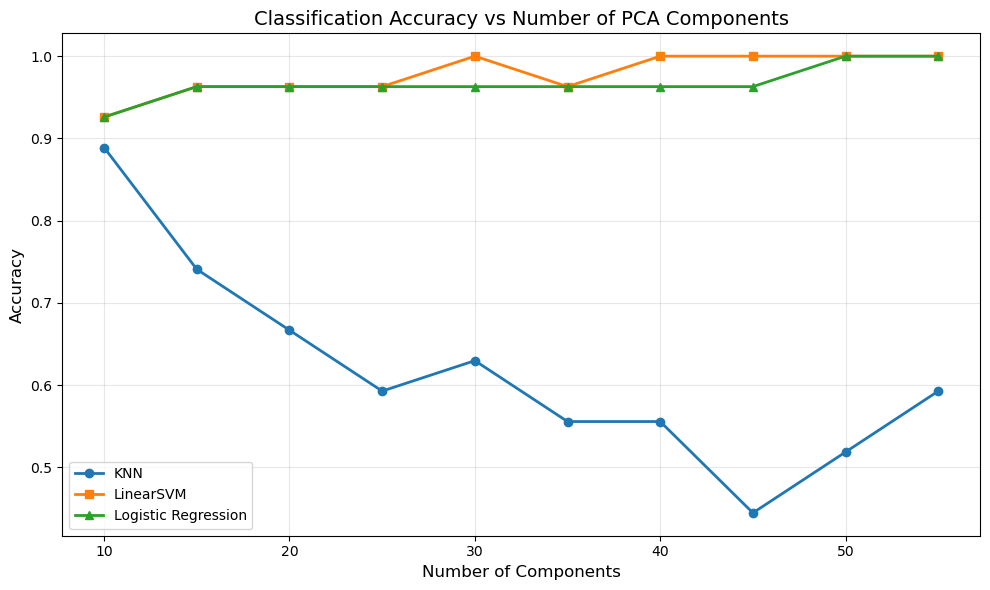

In [20]:
# Sort components so the x-axis is ordered
components = sorted(results.keys())

# Extract accuracies for each classifier in the same order
knn_acc = [results[c]["KNN"] for c in components]
svm_acc = [results[c]["LinearSVM"] for c in components]
LR_acc = [results[c]["LR"] for c in components]

"""
Write the plotting code 
"""
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.plot(components, knn_acc, marker='o', label='KNN', linewidth=2)
plt.plot(components, svm_acc, marker='s', label='LinearSVM', linewidth=2)
plt.plot(components, LR_acc, marker='^', label='Logistic Regression', linewidth=2)


plt.xlabel('Number of Components', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Classification Accuracy vs Number of PCA Components', fontsize=14)
plt.legend(loc='best', fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


**Please train and test the classification model using the best classifier and the best number of components, and plot the confusion matrix give the testing set**

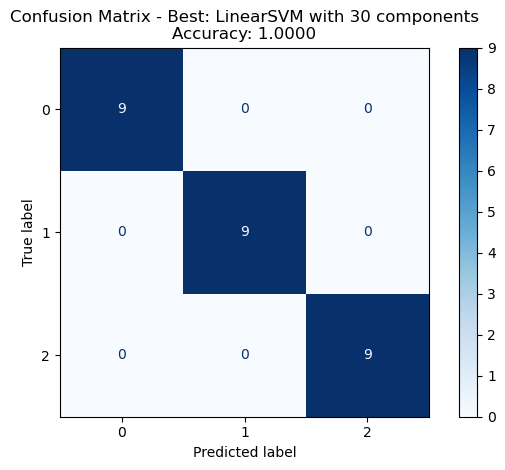

In [21]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


### Write your code 


Vt_best, X_mean_best, S_best = loading_vector_extarction(X_train, n_components=best_components)


X_train_pca_best = feature_matrix_cal(X_train, Vt_best, X_mean_best)
X_test_pca_best = feature_matrix_cal(X_test, Vt_best, X_mean_best)


scaler_best = StandardScaler()
X_train_scaled_best = scaler_best.fit_transform(X_train_pca_best)
X_test_scaled_best = scaler_best.transform(X_test_pca_best)


if best_classifier == 'KNN':
    best_model = KNeighborsClassifier(n_neighbors=5)
elif best_classifier == 'LinearSVM':
    best_model = SVC(kernel='linear', C=1, decision_function_shape='ovr')
else:  # LR
    best_model = LogisticRegression()

best_model.fit(X_train_scaled_best, Y_train)


Y_pred_best = best_model.predict(X_test_scaled_best)


cm_best = confusion_matrix(Y_test, Y_pred_best)


disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best)
disp_best.plot(cmap='Blues')
plt.title(f'Confusion Matrix - Best: {best_classifier} with {best_components} components\nAccuracy: {best_accuracy:.4f}')
plt.tight_layout()
plt.show()


**Please train and test the classification model using the worst classifier and the worst number of components and plot the confusion matrix give the testing set**

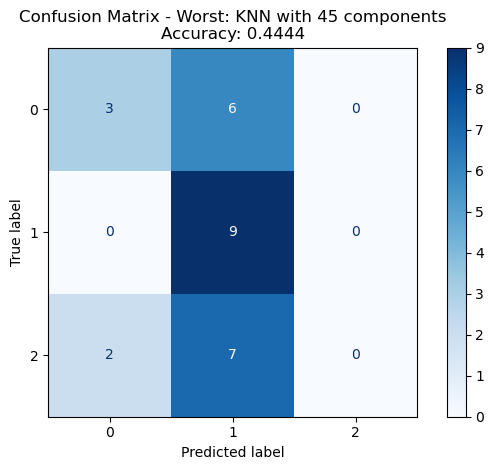

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


### Write your code 

Vt_worst, X_mean_worst, S_worst = loading_vector_extarction(X_train, n_components=worst_components)


X_train_pca_worst = feature_matrix_cal(X_train, Vt_worst, X_mean_worst)
X_test_pca_worst = feature_matrix_cal(X_test, Vt_worst, X_mean_worst)


scaler_worst = StandardScaler()
X_train_scaled_worst = scaler_worst.fit_transform(X_train_pca_worst)
X_test_scaled_worst = scaler_worst.transform(X_test_pca_worst)


if worst_classifier == 'KNN':
    worst_model = KNeighborsClassifier(n_neighbors=5)
elif worst_classifier == 'LinearSVM':
    worst_model = SVC(kernel='linear', C=1, decision_function_shape='ovr')
else:  # LR
    worst_model = LogisticRegression()

worst_model.fit(X_train_scaled_worst, Y_train)


Y_pred_worst = worst_model.predict(X_test_scaled_worst)


cm_worst = confusion_matrix(Y_test, Y_pred_worst)


disp_worst = ConfusionMatrixDisplay(confusion_matrix=cm_worst)
disp_worst.plot(cmap='Blues')
plt.title(f'Confusion Matrix - Worst: {worst_classifier} with {worst_components} components\nAccuracy: {worst_accuracy:.4f}')
plt.tight_layout()
plt.show()